# Road Detection using YOLO
This notebook provides an in-depth analysis and visualization of the Road_Related_Classes-IMGs&Labels dataset, including advanced visualizations, exploratory data analysis, and YOLO for object detection and classification.

In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import numpy as np
from wordcloud import WordCloud

2025-01-20 01:34:24.788237: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-20 01:34:24.799270: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-20 01:34:24.888663: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-20 01:34:24.973876: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-20 01:34:25.045957: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been 

In [2]:
dataset_path = 'data'
train_images_path = os.path.join(dataset_path, 'train', 'images')
train_labels_path = os.path.join(dataset_path, 'train', 'labels')

class_names = [
    'Traffic Light Signal', 'Stop Signal', 'Speedlimit Signal',
    'Crosswalk Signal', 'Crosswalk', 'Pedestrian', 'Bus', 'Car', 'Truck'
]


## Class Distribution

In [14]:
def parse_label_file(label_file):
    with open(label_file, 'r') as file:
        lines = file.readlines()
    return [int(line.split()[0]) for line in lines]

class_counts = Counter()
for label_file in os.listdir(train_labels_path):
    class_counts.update(parse_label_file(os.path.join(train_labels_path, label_file)))



### Bar Plot for Class Distribution


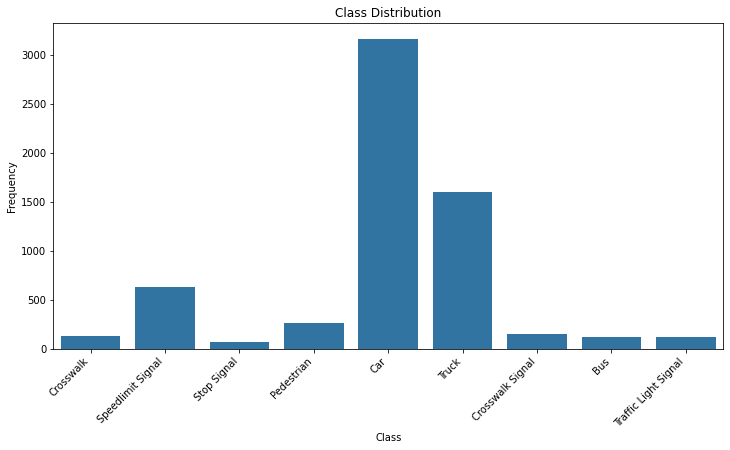

In [15]:
plt.figure(figsize=(12, 6))
sns.barplot(x=[class_names[c] for c in class_counts.keys()], y=list(class_counts.values()))
plt.title('Class Distribution')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()


## Sample Annotations Visualization

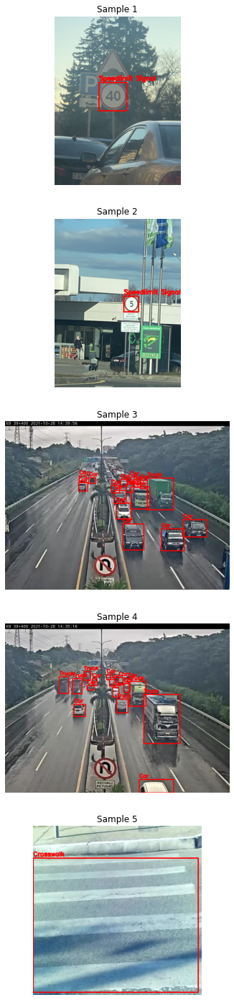

In [4]:
def visualize_sample(images_path, labels_path, num_samples=3):
    samples = os.listdir(images_path)[:num_samples]
    plt.figure(figsize=(15, 5 * num_samples))
    for idx, img_file in enumerate(samples):
        img_path = os.path.join(images_path, img_file)
        label_path = os.path.join(labels_path, img_file.replace('.png', '.txt').replace('.jpg', '.txt'))
        
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        with open(label_path, 'r') as f:
            for line in f.readlines():
                cls, x_center, y_center, width, height = map(float, line.split())
                h, w, _ = image.shape
                x1, y1 = int((x_center - width / 2) * w), int((y_center - height / 2) * h)
                x2, y2 = int((x_center + width / 2) * w), int((y_center + height / 2) * h)
                cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
                cv2.putText(image, class_names[int(cls)], (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        plt.subplot(num_samples, 1, idx + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f'Sample {idx + 1}')
    plt.show()

visualize_sample(train_images_path, train_labels_path, num_samples=5)

## Road Detection using YOLO

In [ ]:
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.3/904.3 kB 15.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 16.6MB/s]


Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



<ipython-input-11-51e042620505>:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(cls_names)


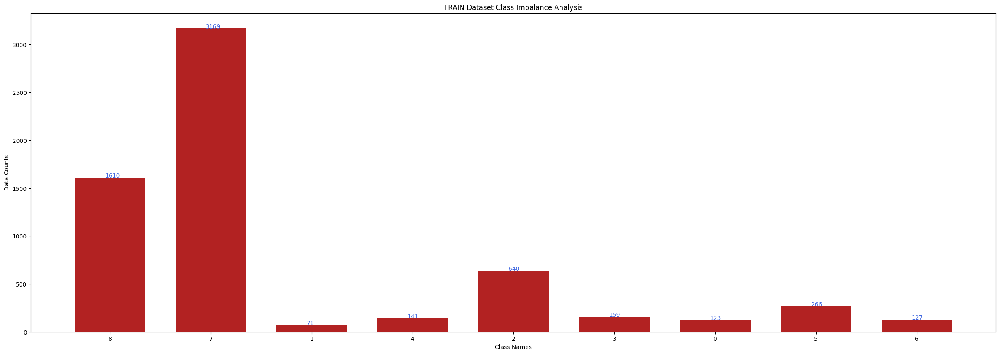

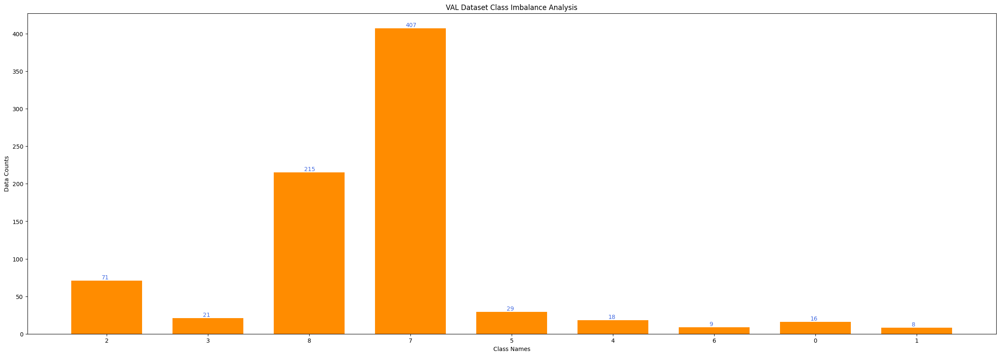

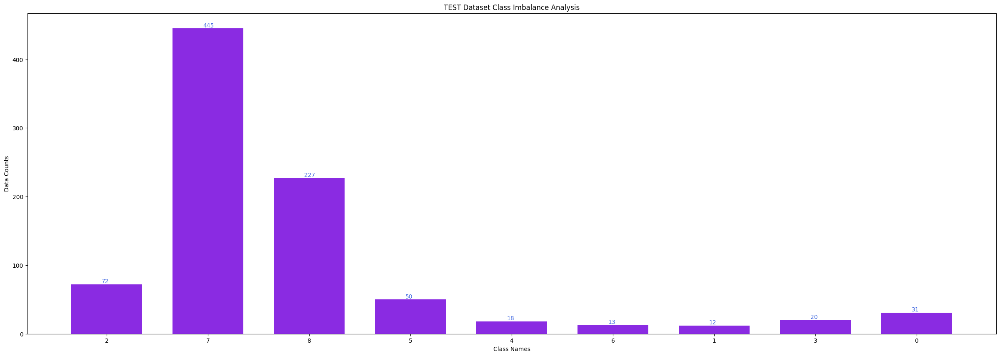

In [ ]:
import cv2, yaml, random, numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]
        
        self.get_cls_names(); self.get_bboxes()        
                
    def get_cls_names(self):

        with open(f"data/dataset.yaml", 'r') as file: data = yaml.safe_load(file)      
        
    
    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{HOME}/datasets/{data_type}/images/*")
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                if ".jpg" in im_path: im_path = im_path.replace(".jpg", ".txt")
                lbl_path  = im_path.replace("images", "labels")
                meta_data = open(lbl_path).readlines()
                for data in meta_data:
                    cls_name = self.class_dict[int(parts[0])]
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)
                    
            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths
    
    def plot(self, rows, cols, count, im_path, bboxes):
    
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:
            
            class_id, x_center, y_center, w, h = bbox

            x_min = int((x_center - w / 2) * width)  
            y_min = int((y_center - h / 2) * height)  
            x_max = int((x_center + w / 2) * width)  
            y_max = int((y_center + h / 2) * height)  
            
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There are {len(bboxes)} object(s) in the image.")
        
        return count + 1

    def vis(self, save_name):
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1
        
        plt.figure(figsize = (25, 20))
                
        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):
        
            if count == self.n_ims + 1: break
            
            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)
            
        plt.show()

    def data_analysis(self, save_name, color):
        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())
        
        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")
    
    def visualization(self): [self.vis(save_name) for save_name in self.data_types]
        
    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]
        
vis = Visualization(data_types = ["train", "val", "test"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

TRAIN Data Visualization is in process...



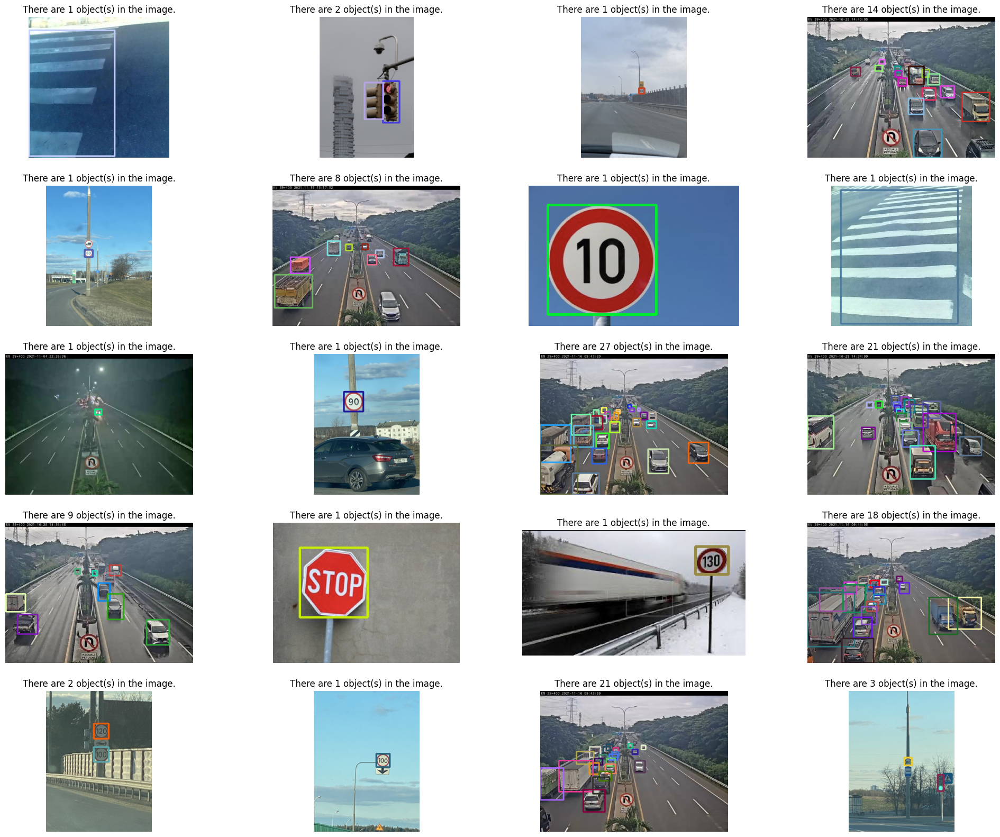

VAL Data Visualization is in process...



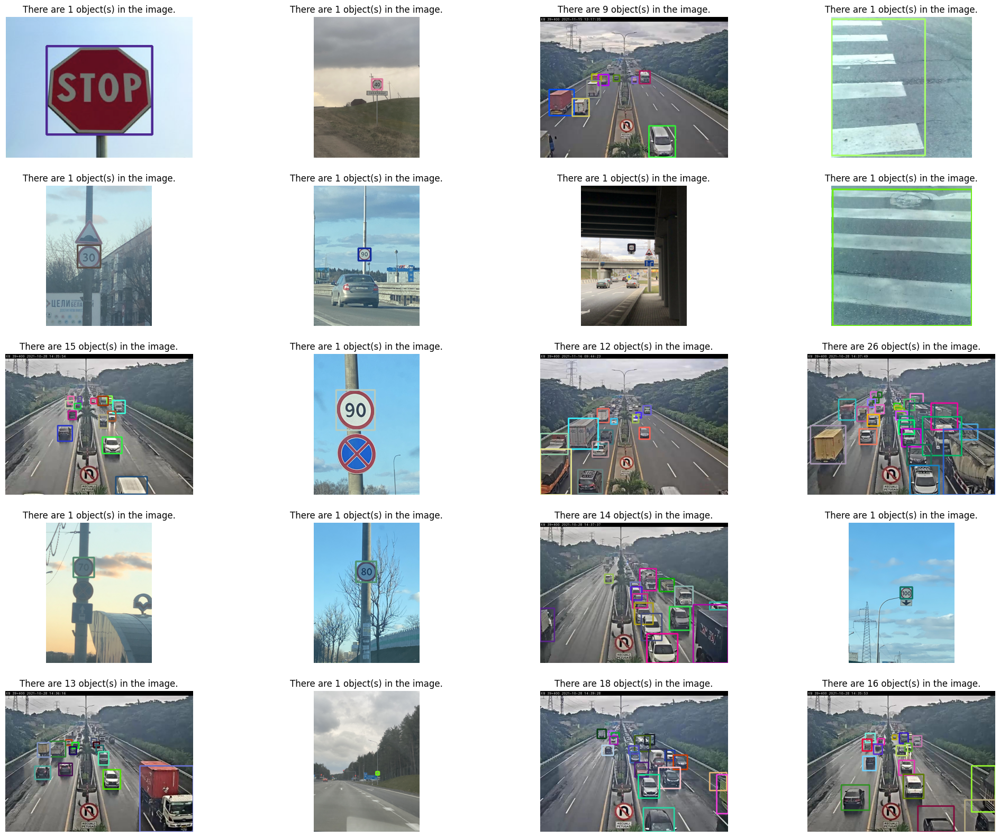

TEST Data Visualization is in process...



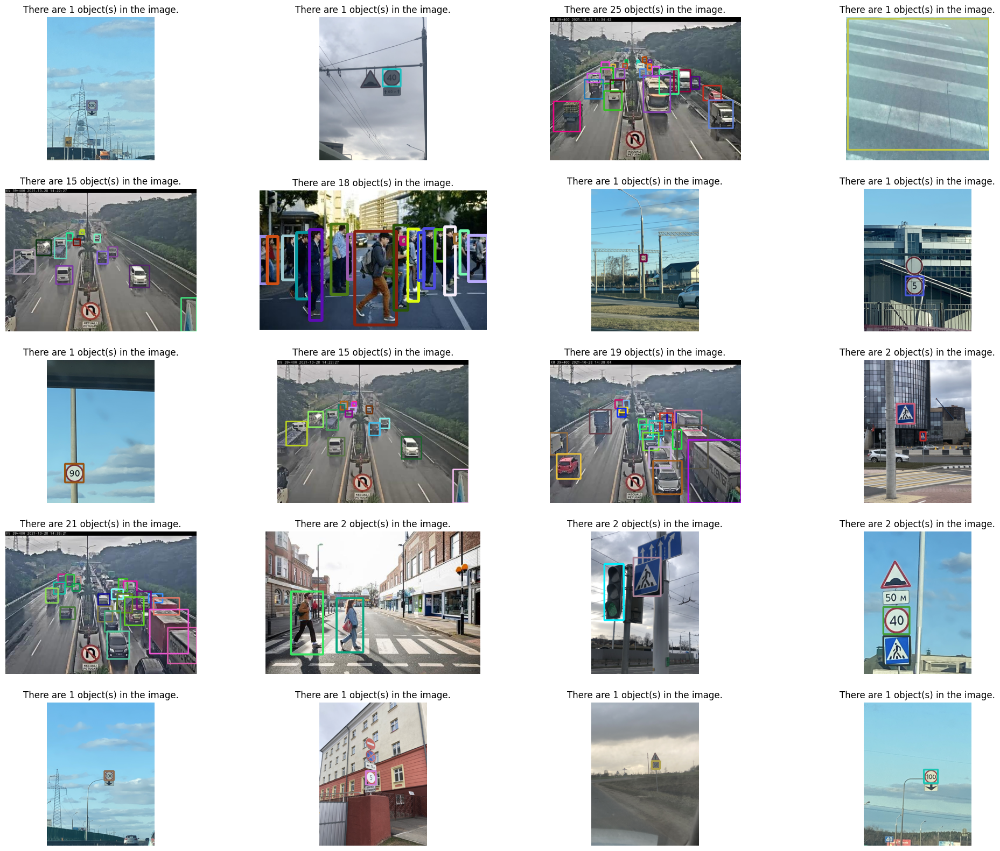

In [ ]:
vis.visualization()

In [ ]:
train_results = model.train(
    data=f"data/dataset.yaml",  
    epochs=10, 
    imgsz=480, 
    device=0  
)


Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/datasets/dataset.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_c

100%|██████████| 755k/755k [00:00<00:00, 4.14MB/s]


Overriding model.yaml nc=80 with nc=9

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/datasets/train/labels... 1263 images, 5 backgrounds, 0 corrupt: 100%|██████████| 1263/1263 [00:01<00:00, 790.03it/s]

train: New cache created: /kaggle/working/datasets/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/datasets/val/labels... 158 images, 0 backgrounds, 0 corrupt: 100%|██████████| 158/158 [00:00<00:00, 1043.67it/s]

val: New cache created: /kaggle/working/datasets/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.57G      1.462      3.239      1.089         55        480: 100%|██████████| 79/79 [00:14<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.34it/s]


                   all        158        794      0.874      0.184      0.471      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.59G      1.458      1.738      1.097         82        480: 100%|██████████| 79/79 [00:12<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.03it/s]

                   all        158        794      0.681      0.541      0.581        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.63G       1.44      1.476      1.108         58        480: 100%|██████████| 79/79 [00:12<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.29it/s]

                   all        158        794      0.789      0.601      0.661      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.59G      1.384      1.373      1.096         63        480: 100%|██████████| 79/79 [00:11<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.31it/s]

                   all        158        794      0.694      0.684      0.709      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.62G       1.36      1.248      1.081         67        480: 100%|██████████| 79/79 [00:11<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.18it/s]

                   all        158        794      0.661      0.683       0.71      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.59G      1.329      1.209      1.088        103        480: 100%|██████████| 79/79 [00:11<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.33it/s]

                   all        158        794      0.712      0.682      0.732      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.57G      1.307      1.129      1.072         42        480: 100%|██████████| 79/79 [00:11<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.52it/s]

                   all        158        794      0.741      0.686      0.742      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.63G      1.278      1.081      1.063         51        480: 100%|██████████| 79/79 [00:11<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.67it/s]

                   all        158        794      0.775      0.681      0.769      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       1.6G      1.267      1.046      1.051         63        480: 100%|██████████| 79/79 [00:11<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.06it/s]

                   all        158        794      0.761      0.699       0.77      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.57G      1.221      1.002      1.033         42        480: 100%|██████████| 79/79 [00:11<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.70it/s]

                   all        158        794      0.758      0.721      0.785      0.574



10 epochs completed in 0.040 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,583,907 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.19it/s]


                   all        158        794      0.758       0.72      0.785      0.575
   Trafic Light Signal          8         16      0.916      0.684       0.77      0.498
           Stop Signal          8          8      0.787          1      0.995      0.893
     Speedlimit Signal         67         71      0.917          1      0.995      0.862
      Crosswalk Signal         17         21      0.879      0.695      0.814      0.671
             Crosswalk         17         18      0.888      0.889      0.917      0.696
            Pedestrian         10         29      0.752      0.828      0.834      0.577
                   Bus          8          9          0          0      0.112     0.0809
                   Car         45        407       0.85      0.649      0.789      0.414
                 Truck         43        215      0.832      0.735      0.843      0.481
Speed: 0.1ms preprocess, 2.0ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs/detect

### Confusion Matrix

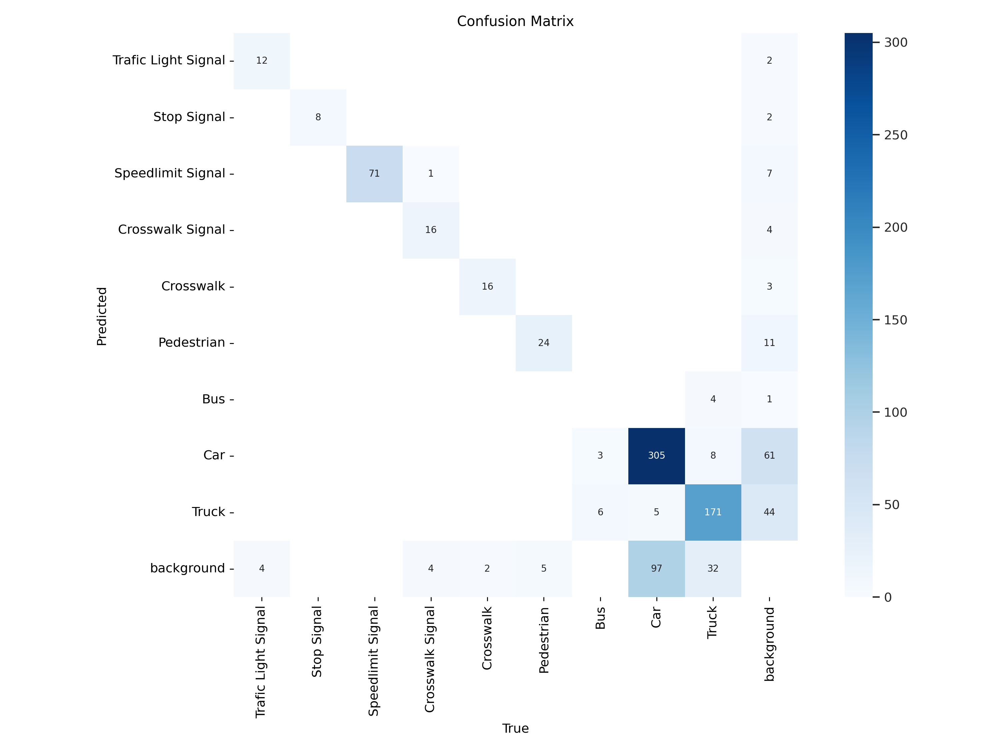

In [ ]:
Image.open(f"runs/detect/train/confusion_matrix.png")

### Visualizations of Results

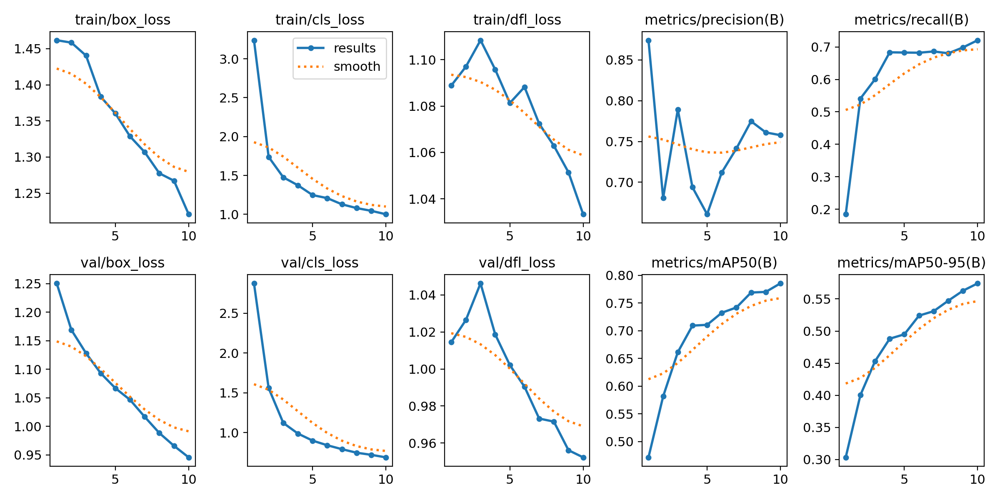

In [ ]:
Image.open(f"runs/detect/train/results.png")

### Precision-Confidence Curve

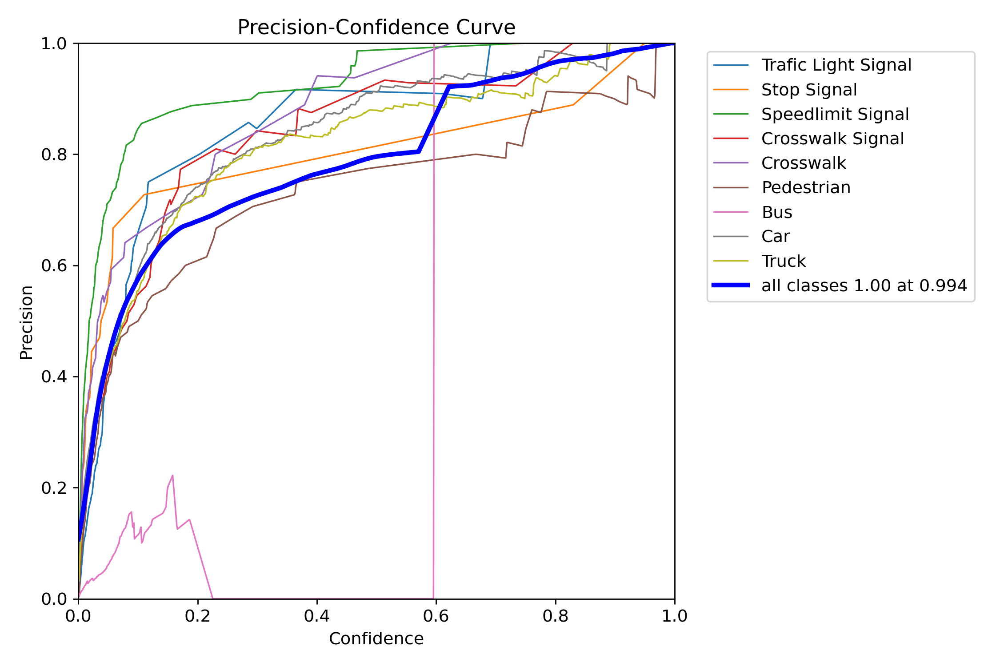

In [ ]:
Image.open(f"runs/detect/train/P_curve.png")

### Precision-Recall Curve

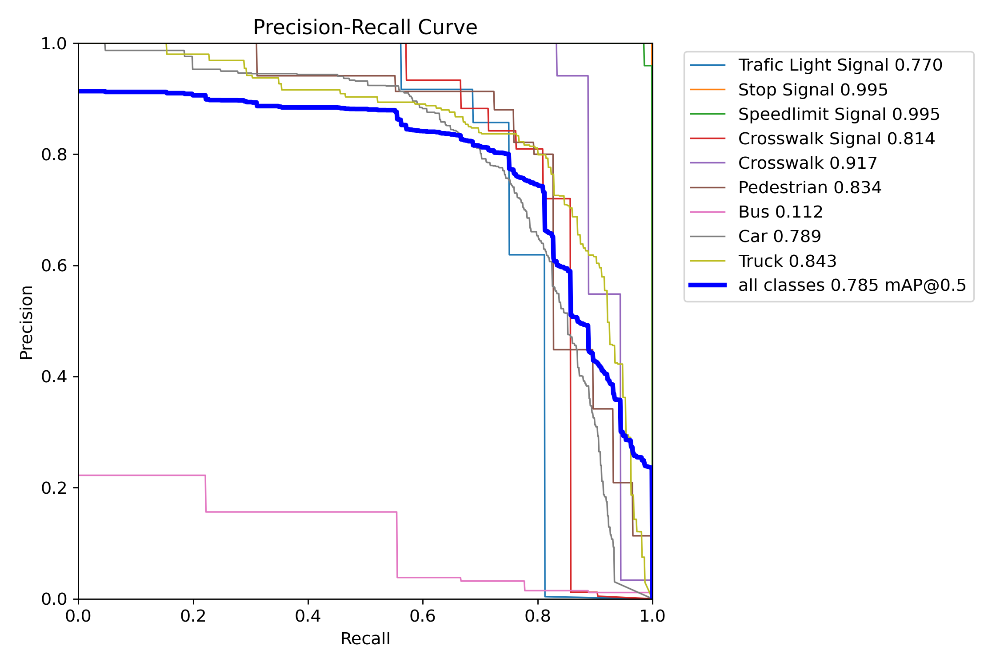

In [ ]:
Image.open(f"runs/detect/train/PR_curve.png")

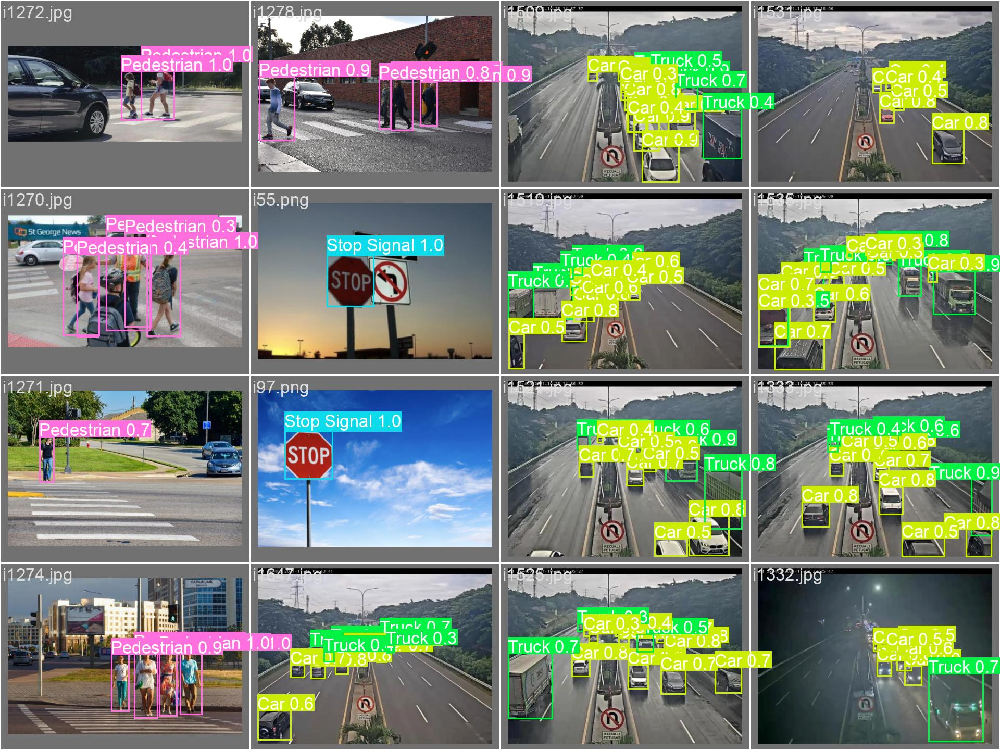

In [ ]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

### Key Points:
1. **Dataset Exploration**:
   - Ensured dataset consistency by identifying missing or mismatched image-label pairs.
   - Visualized the distribution of classes and checked for dataset imbalances.

2. **Preprocessing**:
   - Resized images and normalized pixel values for efficient training.
   - Split the dataset into training and validation sets for model evaluation.

3. **Model Training**:
   - Configured a YOLO-based model for object detection tasks.
   - Incorporated data augmentation to improve generalization.

4. **Evaluation and Visualization**:
   - Evaluated model performance using metrics such as mAP, precision, and recall.
   - Visualized predictions to validate model accuracy qualitatively.


### Conclusion:
The YOLO-based object detection pipeline demonstrated promising results on the road dataset. 
The model effectively detected various road-related objects, including traffic signals, vehicles, and pedestrians. 
